### Import

In [215]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import sklearn
import os
import time
import pickle
import warnings
import graphviz 
import itertools

from sklearn import tree
import xgboost as xgb
from sklearn.model_selection import KFold
from sklearn.cluster import KMeans
from kmodes.kmodes import KModes
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, Lasso, Ridge
from hyperopt import hp, fmin, tpe, space_eval, Trials

from sklearn.metrics import mean_squared_error, accuracy_score, f1_score, precision_score, recall_score

from IPython.display import display, clear_output, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

warnings.filterwarnings("ignore")

### Read data

In [2]:
excel_name = 'UC-TC-Montecarlo_ieee-118-mod-v2.xlsm'

In [5]:
# Nodos de los generadores
gen_nodes = pd.read_excel(excel_name, sheet_name = 'Indices', skiprows = 13, index_col = [0], usecols = [5,7])#.dropna() el NaN que aparece se usa luego por compatib.
gen_nodes = gen_nodes.to_dict()[gen_nodes.columns[0]]

In [7]:
# Lectura de la demanda y la generación intermitente
n_sc = 365
n_h = 24
n_ig = 10

# Demanda total
sc_demand = pd.read_excel(excel_name, sheet_name = 'DemandReserve', skiprows = 4, index_col = [0], usecols = [2,3]).dropna()
sc_demand.columns = ['Demand']
sc_demand.index.name = 'hour'

# Demanda por nodo
sc_bus_load = pd.read_excel(excel_name, sheet_name = 'DemandReserve', skiprows = 4, index_col = [0], usecols = [17,18]).dropna()
sc_bus_load = pd.DataFrame(sc_bus_load.T.values*sc_demand.values, index = sc_demand.index, columns = sc_bus_load.index)
sc_bus_load = pd.concat([sc_bus_load]*n_sc, keys = ['sc'+str(sc).zfill(3) for sc in np.arange(1,n_sc+1)])

# Generación intermitente
sc_ig = pd.read_excel(excel_name, sheet_name = 'IG', skiprows = 4, index_col = [2,4])[['sc'+str(sc).zfill(3) for sc in np.arange(1,n_sc+1)]].dropna().iloc[:n_ig * n_h]
sc_ig = sc_ig.unstack(1).stack(0).swaplevel(axis=0).sort_index()
sc_ig.index.names = ['Sce','hour']
sc_ig.columns.name = 'node'

# Demanda neta total
sc_bus_load[[column for column in sc_ig.columns if column not in sc_bus_load.columns]] = 0
sc_net_demand = sc_bus_load[sc_ig.columns].sub(sc_ig)
sc_net_demand.index.names = ['Sce','hour']
sc_net_demand.columns.name = 'Net demand'
sc_net_demand['total'] = sc_bus_load.sum(axis = 1) - sc_ig.sum(axis = 1)

In [8]:
dim_names = ['Sce', 'hour', 'Result', 'gen'] #, 'su_type'

In [377]:
with open('data_norm.pickle', 'rb') as read_file:
    data_norm = pickle.load(read_file)
    
with open('data_bin.pickle', 'rb') as read_file:
    data_bin = pickle.load(read_file)

### Regression & Classification

#### Regression

In [378]:
var = 'vProduct1'
target = 'Value_norm'

X_sc_net_dem = (sc_net_demand/sc_net_demand.abs().max()).reset_index()
copy_X = X_sc_net_dem.set_index(['Sce','hour']).copy()

if var != 'vCirPF' and var != 'eCirPF':
    copy_y = data_norm[data_norm['Result'] == var].set_index(['Sce','hour','gen']).loc[:, target].unstack('gen').copy() # , 'su_type', 'node', 'start_node', 'end_node', 'circ'

else:
    copy_y = data_norm[data_norm['Result'] == var].copy()
    copy_y['line'] = copy_y['start_node']+copy_y['end_node']+copy_y['circ']
    copy_y = copy_y.set_index(['Sce','hour','line']).loc[:, target].unstack(['line']).copy() # , 'su_type', 'node', 'start_node', 'end_node', 'circ'

In [379]:
# Build X and y

model = 'dt'
select_features = 15 #<1 para no filtrar columnas
clip = (0,1) # (-1, 1) para variables con valores negativos

X = pd.concat([copy_X.unstack(0).shift( 3).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift( 2).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift( 1).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X,
               copy_X.unstack(0).shift(-1).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift(-2).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift(-3).T.unstack(-1).T.swaplevel().sort_index() - copy_X
              ], axis = 1, keys = ['h-3', 'h-2', 'h-1', 'h', 'h+1', 'h+2', 'h+3'])

y = copy_y.loc[X.index]
y = y.stack(dropna = False)

X_cols = X.columns


# Train and test
shuffle = y.index.get_level_values(0).unique().to_series().sample(frac = 1, random_state = 2)
sc_train = shuffle[:int(n_sc*0.8)]
sc_test  = shuffle[int(n_sc*0.8):]


if model == 'gbm':     
    X.columns = ['__'.join(str(level) for level in col) for col in X.columns.values]

else:
    X = X.fillna(9999999)
        
if select_features > 0:
    
    rf = RandomForestRegressor(n_estimators = 200, random_state=0)
    rf.fit(X.loc[sc_train], y.unstack().loc[sc_train])
    importances = pd.Series(rf.feature_importances_, index = X_cols)
    
    cols = [var for var, val in sorted(zip(X_cols, rf.feature_importances_), key= lambda x: x[1], reverse = True)][:select_features]
    X = X[cols]

##### Importances 

In [73]:
if select_features < 1:
    rf = RandomForestRegressor()
    _ = rf.fit(X,y.unstack())
    importances = pd.Series(rf.feature_importances_, index = X_cols)

In [74]:
# Feature importances

feature_names = []

for f in X_cols:
    if f[0] == 'h':
        if f[1] == 'total':
            feature_names.append('            Total ND  [h]      ')
        else:
            feature_names.append('    ND ' + f[1] + '  [h]      ')
            
    else:
        if f[1] == 'total':
            feature_names.append('     Total ΔND  [' + f[0] + ']' + '  '*(f[0][1]=='-') + ' ')
        else:
            feature_names.append('ΔND ' + f[1] + '  [' + f[0] + ']' + '  '*(f[0][1]=='-') + ' ')

importances.index = feature_names

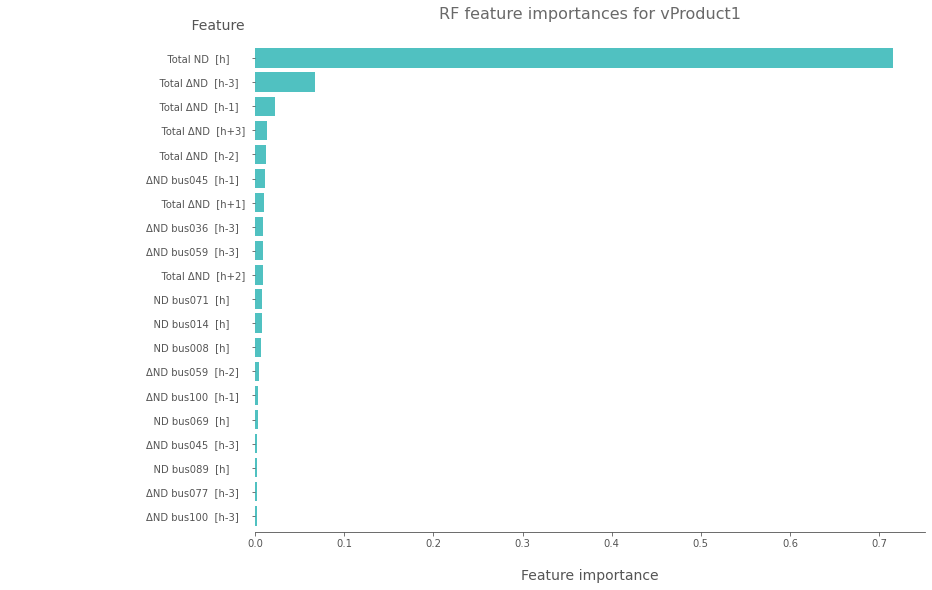

In [75]:
# Plot importances

fig, ax = plt.subplots(figsize = (12,9))
mpl.rcParams['text.color'] = '#555555'

importances.sort_values().iloc[-20:].plot(kind='barh', ax = ax, width = .8, color = '#16adad', alpha = 0.75)

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_color('#4a4a4a')

ax.tick_params(color = '#555555', labelcolor = '#555555')
ax.set_title('RF feature importances for ' + var + '\n', fontsize = 16, color = '#444444', alpha = 0.8)

ax.set_ylabel('                                         Feature', rotation=0, position = (0.3,1.02), fontsize = 14, color = '#555555')
ax.set_xlabel('\nFeature importance', fontsize = 14, color = '#555555')
plt.show()

##### Otros modelos 

In [45]:
# Minimum RMSE (Baseline)

scores = []
for g in y.index.get_level_values(-1).unique():
    scores.append(mean_squared_error(y.unstack(-1).loc[sc_test, g], pd.Series(y.unstack(-1).loc[sc_train, g].mean(), index = y.unstack(-1).loc[sc_test].index)) ** 0.5)
    
print('Minimum mean RMSE:', round(np.mean(scores), 4))
print('std RMSE:', round(np.std(scores), 4))

Minimum mean RMSE: 0.1353
std RMSE: 0.1588


In [46]:
# LR 
model = LinearRegression()

scores = []

for g in y.index.get_level_values(-1).unique():

    model.fit(X.loc[sc_train].fillna(0), y.unstack(2).loc[sc_train, g])
    y_pred = pd.Series(model.predict(X.loc[sc_test].fillna(0)), index = y.unstack(2).loc[sc_test].index).clip(clip[0], clip[1])
    
    scores.append(mean_squared_error(y.unstack(-1).loc[sc_test, g], y_pred) ** 0.5)


print('mean RMSE LR:', round(np.mean(scores), 4))
print('std RMSE LR:', round(np.std(scores), 4))

mean RMSE LR: 0.0742
std RMSE LR: 0.0831


In [51]:
# GBM 
model = xgb.XGBRegressor(eval_metric = 'rmse')

scores = []

for g in y.index.get_level_values(-1).unique():

    model.fit(X.loc[sc_train].fillna(99999), y.unstack(2).loc[sc_train, g])
    y_pred = pd.Series(model.predict(X.loc[sc_test].fillna(99999)), index = y.unstack(2).loc[sc_test].index).clip(clip[0], clip[1])
    
    scores.append(mean_squared_error(y.unstack(-1).loc[sc_test, g], y_pred) ** 0.5)


print('mean RMSE GBM:', round(np.mean(scores), 4))
print('std RMSE GBM:', round(np.std(scores), 4))

mean RMSE GBM: 0.0419
std RMSE GBM: 0.0515


###### Model Tree 

In [52]:
def get_node_samples(decision_path, X_split, level = 0):
    
    start = level * '|   ' + '|--- '
    n_rows = len(decision_path)
    
    if n_rows == 1:
        
        return [{'samples': X_split.index, 'values': eval(decision_path.iloc[0][len(start) + 7:])}]

    else:
        
        leaf_nodes = []
        split = np.arange(n_rows)[decision_path.str.startswith(start)][1]
        
        X_left = X_split[eval(decision_path.iloc[0][len(start):])]
        X_right = X_split[eval(decision_path.iloc[split][len(start):])]
        
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[1:split], X_left, level = level + 1)
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[split + 1:], X_right, level = level + 1)
        
        return leaf_nodes

In [101]:
base_params = (5, 8, 64, 0)

print('Params - max_depth:       ', base_params[0])
print('       - min_samples_leaf:', base_params[1])
print('       - max_leaf_nodes:  ', base_params[2])
print('       - complexity param:', base_params[3])

Params - max_depth:        5
       - min_samples_leaf: 8
       - max_leaf_nodes:   64
       - complexity param: 0


In [86]:
X_cols = X.columns.values
idx = y.index.get_level_values(2).unique()

scores_dt = pd.Series(np.nan, index = idx)
scores_ext = pd.Series(np.nan, index = idx)
dict_params = dict(zip(['max_depth', 'min_samples_leaf', 'max_leaf_nodes', 'ccp_alpha'], base_params))


model = tree.DecisionTreeRegressor(**dict_params, random_state = 0)
model.fit(X.loc[sc_train], y.unstack(2).loc[sc_train])
y_dt = pd.DataFrame(model.predict(X.loc[sc_test]), index = y.unstack(2).loc[sc_test].index, columns = idx).clip(clip[0], clip[1])

feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X.columns]
decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 10,
                                           max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
train_leaves = get_node_samples(decision_path, X.loc[sc_train])
test_leaves = get_node_samples(decision_path, X.loc[sc_test])

y_ext = []
lrs = []


for train_leaf, test_leaf in zip(train_leaves, test_leaves):

    if len(test_leaf['samples']) > 0:

        loop_error_ext = 99999999
        loop_y_ext = None
        select_col = ('h', 'total')


        for col in X.columns:

            lr = LinearRegression().fit(X[X<1000].fillna(0).loc[train_leaf['samples'], [col]], y.unstack(2).loc[train_leaf['samples']])
            loop_y = pd.DataFrame(lr.predict(X[X<1000].fillna(0).loc[train_leaf['samples'], [col]]), index = train_leaf['samples'], columns = idx).clip(clip[0], clip[1])
            loop_error = np.mean([mean_squared_error(y.unstack(2).loc[loop_y.index, g], loop_y[g]) ** 0.5 for g in idx])
            if loop_error <= loop_error_ext:
                if round(loop_error,3) == round(loop_error_ext, 3) and col == ('h', 'total'):
                    select_col = ('h', 'total')
                    loop_error_ext = loop_error
                elif loop_error < loop_error_ext:
                    select_col = col
                    loop_error_ext = loop_error

        lr = LinearRegression().fit(X[X<1000].fillna(0).loc[train_leaf['samples'], [select_col]], y.unstack(2).loc[train_leaf['samples']])
        y_ext.append(pd.DataFrame(lr.predict(X[X<1000].fillna(0).loc[test_leaf['samples'], [select_col]]), index = test_leaf['samples'], columns = idx)).clip(clip[0], clip[1])


        lrs.append(lr)
    else:
        lrs.append(0)

y_ext = pd.concat(y_ext).sort_index().clip(clip[0], clip[1])

for g in idx:

    scores_dt.loc[g] = mean_squared_error(y.unstack(2).loc[y_dt.index, g], y_dt[g]) ** 0.5
    scores_ext.loc[g] = mean_squared_error(y.unstack(2).loc[y_ext.index, g], y_ext[g]) ** 0.5


print('\n' + '-'*20 + '\n' + str(base_params))
print('RMSE DT: ', round(scores_dt.mean(), 4), '\tstd:', round(scores_dt.std(), 4))
print('RMSE EXT:', round(scores_ext.mean(), 4), '\tstd:', round(scores_ext.std(), 4))
print('\n' + '-'*20 + '\n')


--------------------
(5, 8, 64)
RMSE DT:  0.0574 	std: 0.0664
RMSE EXT: 0.0538 	std: 0.0636

--------------------



##### Grid Search

In [216]:
# GRID SEARCH todos los generadores juntos mismo árbol

print_loop = True

n_sc = int(len(X.loc[sc_train])/24)
n_h = 24
n_gen = 54
n_folds = 6

grid = {'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 20],
        'min_samples_leaf': [2, 3, 4, 6, 8, 10, 12, 14, 16, 20, 24, 30, 36],
        'max_leaf_nodes': [16, 32, 64, 128, 256, 512, 1024],
        'ccp_alpha': [0]
       }
    
idx = y.index.get_level_values(2).unique()
cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
grid_scores = pd.Series(np.nan, index = pd.MultiIndex.from_product([grid[key] for key in grid.keys()], names = [key for key in grid.keys()]))

t = time.time()

for params in grid_scores.index:

    params_dict = dict(zip([key for key in grid.keys()], params))
    scores = []
    
    if params_dict['max_leaf_nodes'] > max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]):
        
        grid_scores.loc[params] = grid_scores.loc[(params_dict['max_depth'], 
                                                   params_dict['min_samples_leaf'],  
                                                   max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]))] 
        
    else:    
    
        for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):

            train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
            test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

            model = tree.DecisionTreeRegressor(**params_dict, random_state = 0)
            model.fit(X.loc[sc_train].iloc[train_h], y.loc[sc_train].unstack(2).iloc[train_h])

            y_pred = pd.DataFrame(model.predict(X.loc[sc_train].iloc[test_h]), index = y.loc[sc_train].unstack(2).iloc[test_h].index, columns = idx).clip(clip[0], clip[1])

            for g in idx:

                scores.append(mean_squared_error(y.unstack(2).loc[y_pred.index, g], y_pred[g]) ** 0.5)

        grid_scores[params] = np.mean(scores)
    
    if print_loop:   
        clear_output(wait=True)
        print('Grid Search...', round(100 * print_loop/len(grid_scores), 2), '%')
        print('Running time:', int(time.time() - t), ' s')
        print('Best:', round(grid_scores.min(), 4))
        print_loop = print_loop + 1 


Grid Search... 100.0 %
Running time: 21637  s
Best: 0.0363


In [266]:
# GRID SEARCH por separado

print_loop = True

n_sc = int(len(X.loc[sc_train])/24)
n_h = 24
n_gen = 54
n_folds = 6
    
grid = {'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 20],
        'min_samples_leaf': [1, 2, 3, 4, 5, 6, 8, 10, 12, 14, 16, 20, 24, 32, 40, 52, 64],
        'max_leaf_nodes': [16, 32, 64, 128, 256, 512, 1024, 2048],
        'ccp_alpha': [0]
          }
    

cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
grid_scores = pd.DataFrame(np.nan, 
                           columns = y.unstack(2).columns,
                           index = pd.MultiIndex.from_product([grid[key] for key in grid.keys()], names = [key for key in grid.keys()]))

t = time.time()

for params in grid_scores.index:

    params_dict = dict(zip([key for key in grid.keys()], params))
    
    if params_dict['max_leaf_nodes'] > max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]):
        
        grid_scores.loc[params] = grid_scores.loc[(params_dict['max_depth'], 
                                                   params_dict['min_samples_leaf'],  
                                                   max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]))] 
        
    else:
        
        for g in grid_scores.columns:    

            scores = []

            for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):

                train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
                test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

                model = tree.DecisionTreeRegressor(**params_dict, random_state = 0)
                model.fit(X.loc[sc_train].iloc[train_h], y.loc[sc_train].loc[pd.IndexSlice[:,:,g]].iloc[train_h])

                y_pred = pd.Series(model.predict(X.loc[sc_train].iloc[test_h]), index = y.loc[sc_train].loc[pd.IndexSlice[:,:,[g]]].iloc[test_h].index).clip(clip[0], clip[1])

                scores.append(mean_squared_error(y.loc[y_pred.index], y_pred) ** 0.5)

            grid_scores.loc[params, g] = np.mean(scores)

    if print_loop:   
        clear_output(wait=True)
        print('Grid Search...', round(100 * print_loop/len(grid_scores), 2), '%')
        print('Running time:', int(time.time() - t), ' s')
        print('Best:', round(grid_scores.min().mean(), 4))
        print('\n\n', round(grid_scores.min(), 4))
        print_loop = print_loop + 1 

Grid Search... 100.0 %
Running time: 7929  s
Best: 0.0356


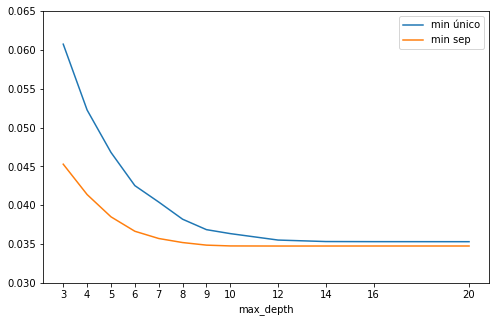

In [17]:
param = 'max_depth'
#param = 'min_samples_leaf'
#param = 'max_leaf_nodes'

plt.figure(figsize = (8,5))
plt.ylim(0.03,0.065)
plt.xticks(list(set(grid_scores_sep.index.to_frame()[param].unique()).union(set(grid_scores_unico.index.to_frame()[param].unique()))))
grid_scores_unico.groupby(param).min().plot(label = 'single DT')
grid_scores_sep.mean(axis = 1).groupby(param).min().plot(label = 'mutiple DTs')
plt.legend()
plt.show()

##### Bayesian Optimization 

In [338]:
# OPT BAYESIANA

max_evals = 70 #(per depth)



bayes_scores = pd.DataFrame(columns = ['max_depth', 'min_samples_leaf', 'max_leaf_nodes', 'ccp_alpha', 'error'], index = np.arange(8))

for depth in range(3, 11):
    space = {'max_depth': hp.choice('max_depth', [depth]),
             'min_samples_leaf': hp.quniform('min_samples_leaf', 2, 200, 2),
             'max_leaf_nodes': hp.qloguniform('max_leaf_nodes', np.log(16), np.log(2**10), 2),
             'ccp_alpha': hp.loguniform('ccp_alpha', np.log(1e-8), np.log(1e-4))
            }


    def objective(params):
        
        n_sc = int(len(X.loc[sc_train])/24)
        n_h = 24
        n_gen = 54
        n_folds = 6

        try:
            idx = y.index.get_level_values(2).unique()
            params_dict = dict(zip([key for key in params.keys()], [int(params[key]) for key in params.keys()]))
            cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
            scores = []

            for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):

                train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
                test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

                model = tree.DecisionTreeRegressor(**params_dict, random_state = 0)

                model.fit(X.loc[sc_train].iloc[train_h], y.loc[sc_train].unstack(2).iloc[train_h])

                y_pred = pd.DataFrame(model.predict(X.loc[sc_train].iloc[test_h]), index = y.loc[sc_train].unstack(2).iloc[test_h].index, columns = idx).clip(clip[0], clip[1])

                for g in idx:
                    scores.append(mean_squared_error(y.unstack(2).loc[y_pred.index, g], y_pred[g]) ** 0.5)

            error = np.mean(scores)

        except:
            error = 1000000     
        return error     #Minimize

    trials = Trials()
    best = fmin(fn = objective, space = space, max_evals = max_evals, algo = tpe.suggest, trials = trials)
    bayes_scores.loc[depth-3] = [depth, best['min_samples_leaf'], best['max_leaf_nodes'], best['ccp_alpha'], min(trials.losses())] 
    print('\nDepth ' + str(depth) + ':', best, '\n\n')


In [339]:
bayes_scores

##### Train

In [147]:
base_params = (4, 8, 32, 0) # Select from Hyperparameter optimization

print('Params - max_depth:       ', base_params[0])
print('       - min_samples_leaf:', base_params[1])
print('       - max_leaf_nodes:  ', base_params[2])
print('       - complexity param:', base_params[3])

Params - max_depth:        4
       - min_samples_leaf: 8
       - max_leaf_nodes:   32
       - complexity param: 0


In [148]:
def get_node_samples(decision_path, X_split, level = 0):
    
    start = level * '|   ' + '|--- '
    n_rows = len(decision_path)
    
    if n_rows == 1:
        
        return [{'samples': X_split.index, 'values': eval(decision_path.iloc[0][len(start) + 7:])}]

    else:
        
        leaf_nodes = []
        split = np.arange(n_rows)[decision_path.str.startswith(start)][1]
        
        X_left = X_split[eval(decision_path.iloc[0][len(start):])]
        X_right = X_split[eval(decision_path.iloc[split][len(start):])]
        
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[1:split], X_left, level = level + 1)
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[split + 1:], X_right, level = level + 1)
        
        return leaf_nodes

In [157]:
# TRAIN  

dict_params =  {'max_depth': base_params[0],
                'min_samples_leaf': base_params[1], 
                'max_leaf_nodes': base_params[2],
                'ccp_alpha': base_params[3]
               }

add_lr = 'select' # 'select', 'select2', 'h', False
clip = (0,1) # (-1, 1) para variables con valores negativos


X_cols = X.columns.values
idx = y.index.get_level_values(2).unique()
n_h = 24
n_gen = 54
n_folds = 6

model = tree.DecisionTreeRegressor(**dict_params, random_state = 0)
model.fit(X, y.unstack(2))

if add_lr:

    feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X.columns]
    decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 10,
                                               max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
    tree_leaves = get_terminal_node_samples(decision_path, X)

    if add_lr == 'h': 

        lr_tnodes = []
        for tree_leaf in tree_leaves:

            lr = LinearRegression().fit(X[X<1000].fillna(0).loc[tree_leaf['samples'], ['h']], y.unstack(2).loc[tree_leaf['samples']])
            lr_tnodes.append({'lr': lr, 'var': 'h'})

    if add_lr == 'select': 

        lr_tnodes = []
        for tree_leaf in tree_leaves:

            leaf_error = 999999
            select_col = 'h'

            for col in X_cols:
                lr = LinearRegression().fit(X[X<1000].fillna(0).loc[tree_leaf['samples'], [col]], y.unstack(2).loc[tree_leaf['samples']])
                y_pred = pd.DataFrame(lr.predict(X[X<1000].fillna(0).loc[tree_leaf['samples'], [col]]), index = tree_leaf['samples'], columns = idx).clip(clip[0], clip[1])
                pred_error = np.mean([mean_squared_error(y.unstack(2).loc[y_pred.index, g], y_pred[g]) ** 0.5 for g in idx])

                if round(pred_error, 3) < round(leaf_error, 3):
                        select_col = col
                        leaf_error = pred_error

            lr = LinearRegression().fit(X[X<1000].fillna(0).loc[tree_leaf['samples'], [select_col]], y.unstack(2).loc[tree_leaf['samples']])
            lr_tnodes.append({'lr': lr, 'var': select_col})

    if add_lr == 'select2': 

        lr_tnodes = []
        for tree_leaf in tree_leaves:

            leaf_error = 999999
            select_cols = ('h', 'h-1')

            for cols in [*itertools.combinations(X_cols, 2)]:
                lr = LinearRegression().fit(X[X<1000].fillna(0).loc[tree_leaf['samples'], [*cols]], y.unstack(2).loc[tree_leaf['samples']])
                y_pred = pd.DataFrame(lr.predict(X[X<1000].fillna(0).loc[tree_leaf['samples'], [*cols]]), index = tree_leaf['samples'], columns = idx).clip(clip[0], clip[1])
                pred_error = np.mean([mean_squared_error(y.unstack(2).loc[y_pred.index, g], y_pred[g]) ** 0.5 for g in idx])

                if round(pred_error, 3) < round(leaf_error, 3):
                        select_cols = cols
                        leaf_error = pred_error

            lr = LinearRegression().fit(X[X<1000].fillna(0).loc[tree_leaf['samples'], [*select_cols]], y.unstack(2).loc[tree_leaf['samples']])
            lr_tnodes.append({'lr': lr, 'var': select_cols})

###### Train & score 

In [15]:
# TRAIN DT + LR 
mod = 'dt'
   
n_h = 24
n_gen = 54
n_folds = 6

cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
cv_scores_dt = pd.DataFrame(np.nan, index = y.index.get_level_values(2).unique(), columns = np.arange(n_folds))
cv_scores_ext = pd.DataFrame(np.nan, index = y.index.get_level_values(2).unique(), columns = np.arange(n_folds))
dict_params = dict(zip(['max_depth', 'min_samples_leaf', 'max_leaf_nodes'], base_params))

i = 0
for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):


    train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
    test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

    model = tree.DecisionTreeRegressor(**dict_params, random_state = 0)
    model.fit(X.iloc[train_h], y.unstack(2).iloc[train_h])
    y_pred = pd.DataFrame(model.predict(X.iloc[test_h]), index = y.unstack(2).iloc[test_h].index, columns = cv_scores_dt.index).clip(clip[0], clip[1])
    
    feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X.columns]
    decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 10,
                                               max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
    train_leaves = get_node_samples(decision_path, X.iloc[train_h])
    test_leaves = get_node_samples(decision_path, X.iloc[test_h])
    
    y_ext = []
    lrs = []
    
    for train_leaf, test_leaf in zip(train_leaves, test_leaves):
        
        if len(test_leaf['samples']) > 0:
                
            lr = LinearRegression().fit(X.loc[train_leaf['samples']], y.unstack(2).loc[train_leaf['samples']])
            y_ext.append(pd.DataFrame(X.loc[test_leaf['samples']].values.dot(np.transpose(lr.coef_)) + np.concatenate([[lr.intercept_]] * len(test_leaf['samples'])),
                                     index = test_leaf['samples'], 
                                     columns = cv_scores_ext.index))
            lrs.append(lr)
        else:
            lrs.append(0)
    
    y_ext = pd.concat(y_ext).sort_index().clip(clip[0], clip[1])
            

    for g in cv_scores_dt.index:
        
        cv_scores_dt.loc[g, i] = mean_squared_error(y.unstack(2).loc[y_pred.index, g], y_pred[g]) ** 0.5
        cv_scores_ext.loc[g, i] = mean_squared_error(y.unstack(2).loc[y_ext.index, g], y_ext[g]) ** 0.5

    i = i+1
        
print('RMSE DT:', round(cv_scores_dt.mean(axis = 1).mean(), 4))
print('RMSE EXT:', round(cv_scores_ext.mean(axis = 1).mean(), 4))

RMSE DT: 0.0582
RMSE EXT: 0.0456


##### Plot Tree 

In [158]:
def get_node_samples(decision_path, X_split, level = 0):
    
    start = level * '|   ' + '|--- '
    n_rows = len(decision_path)
    
    if n_rows == 1:
        
        return [X_split.index]

    else:
        
        leaf_nodes = [X_split.index]
        split = np.arange(n_rows)[decision_path.str.startswith(start)][1]
        
        X_left = X_split[eval(decision_path.iloc[0][len(start):])]
        X_right = X_split[eval(decision_path.iloc[split][len(start):])]
        
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[1:split], X_left, level = level + 1)
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[split + 1:], X_right, level = level + 1)
        
        return leaf_nodes

In [159]:
def get_terminal_node_samples(decision_path, X_split, level = 0):
    
    start = level * '|   ' + '|--- '
    n_rows = len(decision_path)
    
    if n_rows == 1:
        
        return [{'samples': X_split.index, 'values': eval(decision_path.iloc[0][len(start) + 7:])}]

    else:
        
        leaf_nodes = []
        split = np.arange(n_rows)[decision_path.str.startswith(start)][1]
        
        X_left = X_split[eval(decision_path.iloc[0][len(start):])]
        X_right = X_split[eval(decision_path.iloc[split][len(start):])]
        
        leaf_nodes = leaf_nodes + get_terminal_node_samples(decision_path.iloc[1:split], X_left, level = level + 1)
        leaf_nodes = leaf_nodes + get_terminal_node_samples(decision_path.iloc[split + 1:], X_right, level = level + 1)
        
        return leaf_nodes

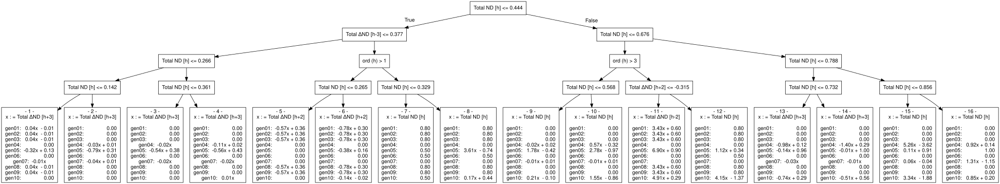

In [193]:
# Process text + LR  
remove_error   = True
remove_samples = True
include_values = True
include_names  = True
only_leaves    = True
leaf_label     = True
all_errors     = True
replace_NaN    = True
fill_color     = False
add_lr         = True
include_lr     = True
add_line       = 1
lr_prec        = 2

X_error        = X.copy()
y_error        = y.unstack(2).copy()

gen = y_error.columns[:10]
#gen = y_error.T.drop_duplicates().index
#gen = ['gen' + str(g).zfill(2) for g in [3, 27]]

ss = []
tree_graph = tree.export_graphviz(model, 
                                  filled = fill_color, 
                                  precision = 3,
                                  label = 'none',
                                  impurity = True,
                                  #feature_names = [str(col[1]).replace('total','Total') + ' Net Demand [' + str(col[0]) + ']' for col in X_error.columns]
                                  feature_names = ['Total '*(col[1] == 'total') + 'Δ'*(col[0] != 'h') + 'ND ' +  (col[1] + ' ')*(col[1] != 'total') + '[' + str(col[0]) + ']' for col in X_error.columns]
                                 ).split('\n')
if 1: 
    n, t = 0, 0
    tree_graph_error = tree.export_graphviz(model, 
                                            precision = 15,
                                            label = 'none',
                                            impurity = False,
                                            #feature_names = [str(col[1]).replace('total','Total') + ' Net Demand [' + str(col[0]) + ']' for col in X_error.columns]
                                            feature_names = ['Total '*(col[1] == 'total') + 'Δ'*(col[0] != 'h') + 'ND ' +  (col[1] + ' ')*(col[1] != 'total') + '[' + str(col[0]) + ']' for col in X_error.columns]
                                 ).split('\n')
    feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X_error.columns]
    decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                               max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
    tree_nodes = get_node_samples(decision_path, X_error)
    include_lr = add_lr and include_lr
    frmt = [''.join(['{:', str(4+lr_prec), '.', str(lr_prec),'f}']), ''.join(['{:', str(2+lr_prec), '.', str(lr_prec),'f}'])]

for i in range(2, len(tree_graph) - 1):
    
    string = tree_graph[i]
    
    if string.find('->') == -1:
        
        try:
            split0 = string.find('"')
            split1 = string.find('[[')
            split2 = string.find(']]')
            cond   = string.find('<=')

            values = pd.Series(eval(string[split1 + 1: split2 + 1].replace(']\\n[', ',')), index = y_error.columns).loc[gen]

            if cond == -1:
                node = pd.Series([string[:split0 + 1]] + string[split0 + 1: split1 - 2].split('\\n'), index = ['label', 'error', 'samples'])   
            else:
                node = pd.Series(string[: split1 - 2].split('\\n'), index = ['label', 'error', 'samples'])
                if replace_NaN and float(node['label'][cond + 2:]) > 1:
                    node['label'] = node['label'][:split0 + 1] + 'ord (h) > ' + node['label'][cond - 3]  + '\\n' #node['label'][:cond] + '!= NaN\\n'
                else:
                    node['label'] = node['label'] + '\\n'

            if remove_error:
                node['error'] = ''
            else:

                if len(tree_nodes[n]) > 0:

                    y_node = y_error.loc[tree_nodes[n]]

                    if cond != -1 or not include_lr:
                        string2 = tree_graph_error[i]
                        start = string2.find('[[')
                        end = string2.find(']]')
                        y_pred = pd.DataFrame([eval(string2[start + 1: end + 1].replace(']\\n[', ','))] * len(tree_nodes[n]), 
                                              index = tree_nodes[n], columns = y_error.columns)

                    else:
                        y_pred = pd.DataFrame(lr_tnodes[t]['lr'].predict(X[X<1000].fillna(0).loc[tree_nodes[n], [lr_tnodes[t]['var']]]), 
                                              index = tree_nodes[n], columns = y_error.columns)


                    if all_errors:
                        node_error = [mean_squared_error(y_node[g], y_pred[g]) ** 0.5 for g in y_error.columns]
                    else:
                        node_error = [mean_squared_error(y_node[g], y_pred[g]) ** 0.5 for g in gen]

                    node_error = str(round(np.mean(node_error), 3))

                else:
                    node_error = '-'

                node['error'] = ''.join((('mean RMSE: ', 'RMSE: ')[int(len(gen) == 1)], node_error, '\\n'))          

            if leaf_label and cond == -1:
                node['leaf'] = ''.join(('- ', str(t+1), ' -', '\\n')) 
                ss.append(int(node['samples']))
            else:      
                node['leaf'] = ''  

            if remove_samples:
                node['samples'] = ''
            else:
                node['samples'] = ''.join(('samples: ', node['samples'], '\\n'))


            if include_lr and cond == -1:

                values = pd.DataFrame({'coef':np.transpose(lr_tnodes[t]['lr'].coef_[:,0]), 'intercept':lr_tnodes[t]['lr'].intercept_}, index = y_error.columns).loc[gen]
                values['out'] = values.apply(lambda x: frmt[0].format(x['coef']) + ('x  - ','x    ','x + ')[int(np.sign(round(x['intercept'], lr_prec)) + 1)] 
                                                       if round(x['coef'], lr_prec) != 0  
                                                       else ' '*(8 + 2*lr_prec) + ('   ', ' - ')[int(x['intercept'] < 0)], axis = 1)
                values = values.apply(lambda x: x['out'] + frmt[1].format(np.abs(x['intercept'])) 
                                                if (round(x['intercept'], lr_prec) != 0 or round(x['coef'], lr_prec) == 0) 
                                                else x['out'] + ' '*(3 + 2*lr_prec), axis = 1)#.str.replace('0.'+'0'*lr_prec, '0 '+' '*lr_prec)

                t = t + 1
            else:    
                values = values.astype(str)   

            if include_values and include_names and (not only_leaves or cond == -1):
                if include_lr and cond == -1:
                    values = '\\n'.join((''.join((gen, ': ', val)) for gen, val in values.iteritems()))
                    #values = 'x : = {0:s} Net Demand [{1:s}]'.format(lr_tnodes[t-1]['var'][1].replace('total', 'Total'),lr_tnodes[t-1]['var'][0]) + '\\n\\n' + values
                    lr_var = lr_tnodes[t-1]['var']
                    values = 'x : = ' + 'Total '*(lr_var[1] == 'total') + 'Δ'*(lr_var[0] != 'h') + 'ND ' +  (lr_var[1] + ' ')*(lr_var[1] != 'total') + '[' + str(lr_var[0]) + ']' + '\\n\\n' + values
                else:
                    max_len = values.str.len().max() 
                    values = '\\n'.join((''.join((gen, ': ', val, '  '*(max_len - len(val)))) for gen, val in values.iteritems()))
            elif include_values and (not only_leaves or cond == -1):
                values = '\\n'.join(values)
            else:
                values = ''


            tree_graph[i] = ''.join((node['label'], 
                                     '\\n' * (add_line > 1 and cond >= 0), node['error'], node['samples'], node['leaf'], 
                                     '\\n' * (add_line > 0 and include_values and (not only_leaves or cond == -1) and not (remove_error and remove_samples)), 
                                     values)) + string[split2 + 2:]

            n = n + 1  
        except:
            n = n + 1 
        
tree_graph = '\n'.join(tree_graph)



with open('tree_vProduct1.svg', 'w', encoding="utf-8") as f:
    f.write(graph._repr_svg_())  
graph = graphviz.Source(tree_graph)
with open("tree_vProduct1.dot", "w", encoding="utf-8") as tree_file:
    tree_file.write(tree_graph)   
graph

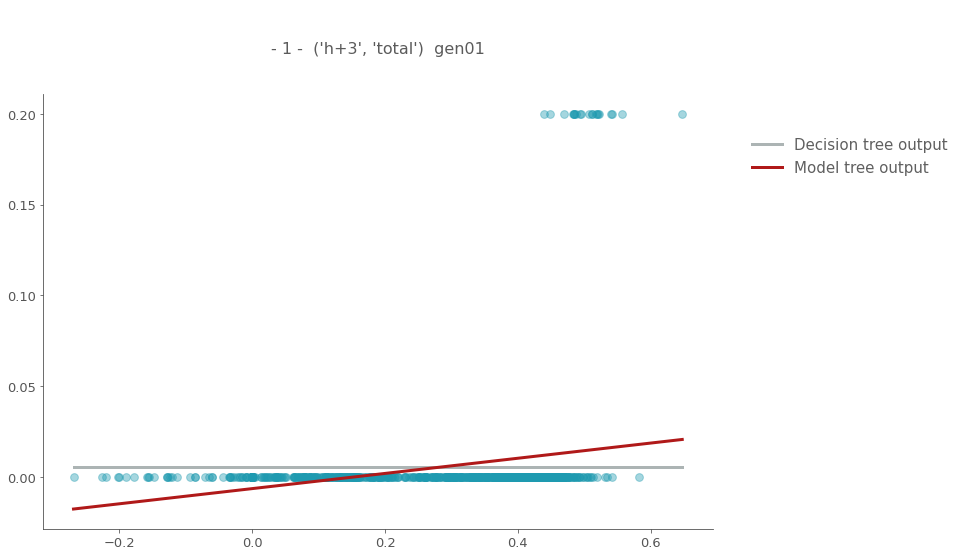

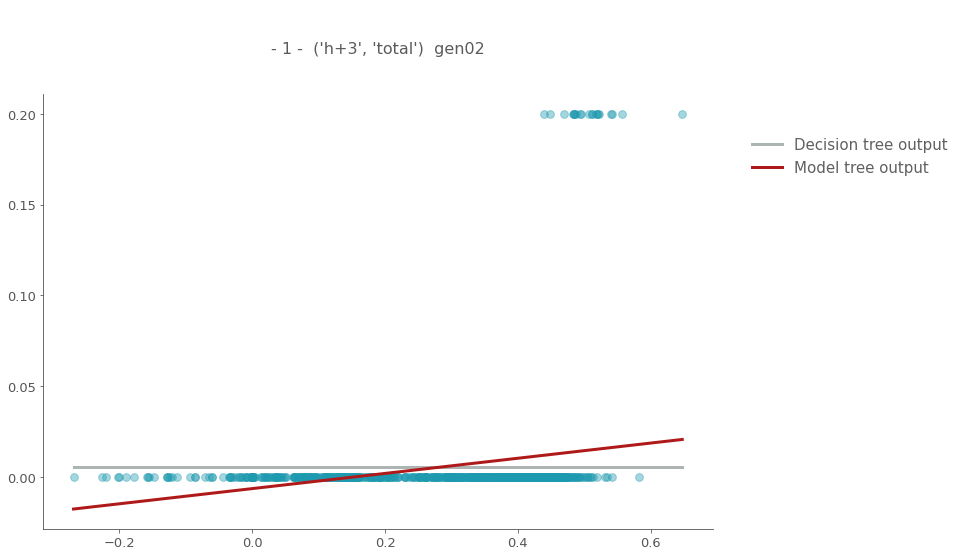

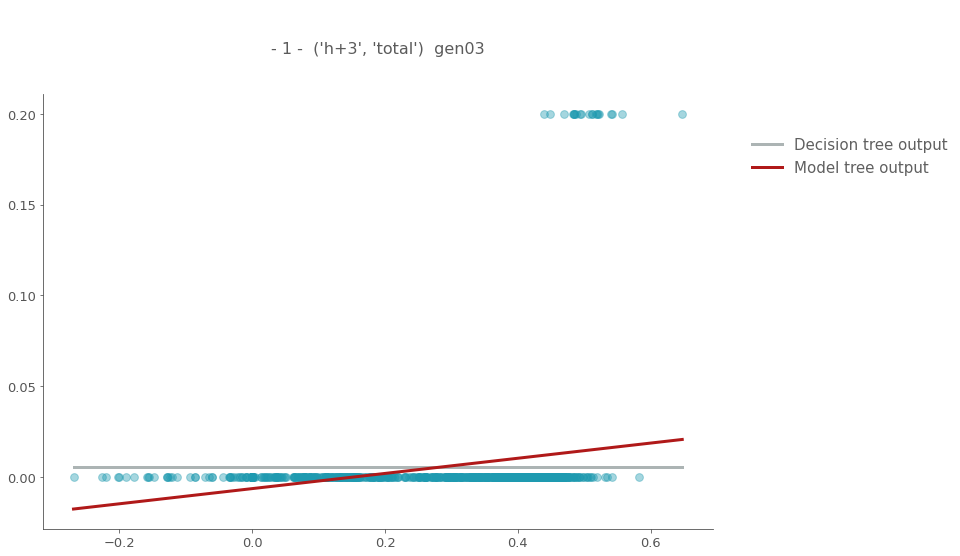

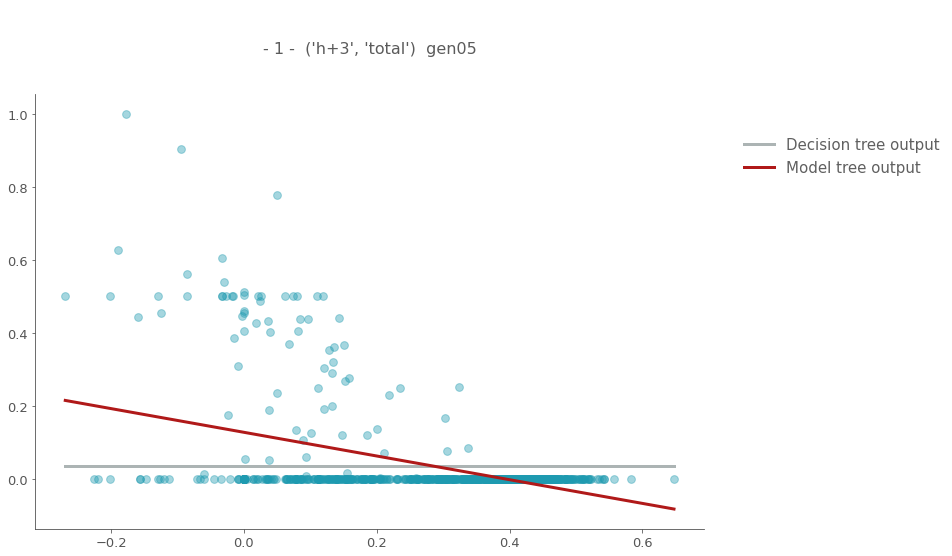

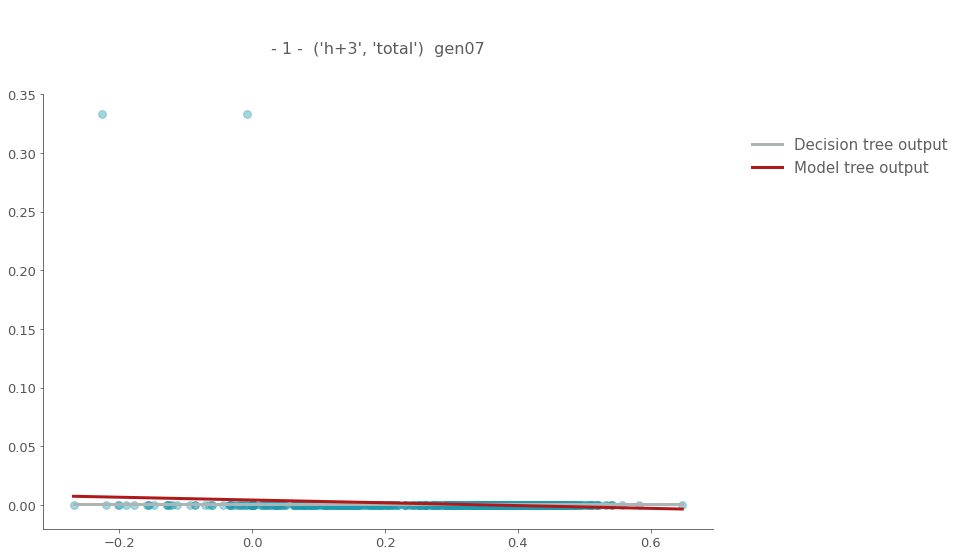

...

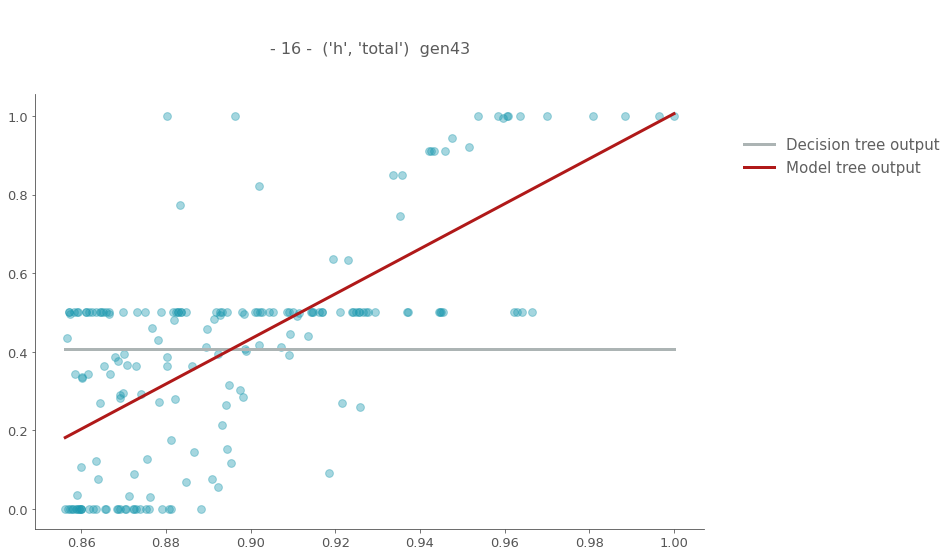

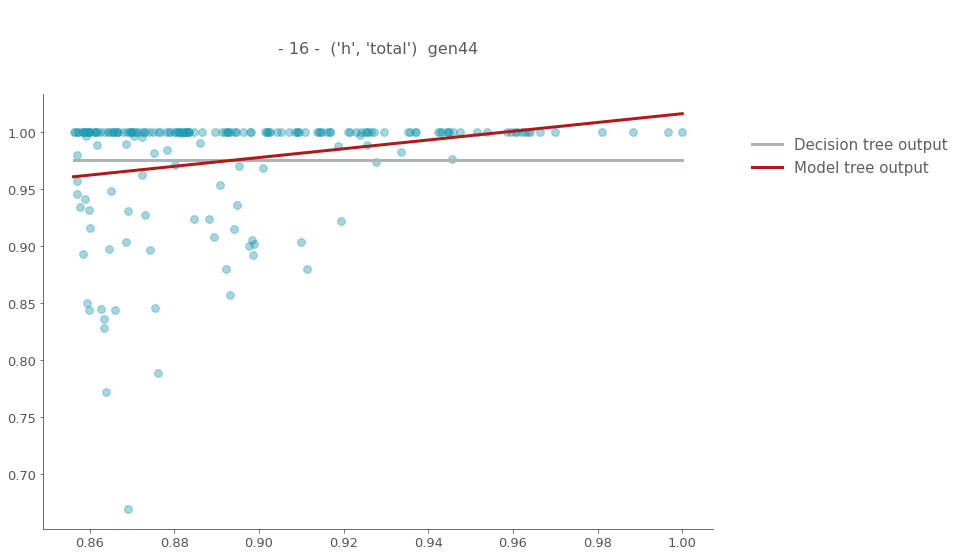

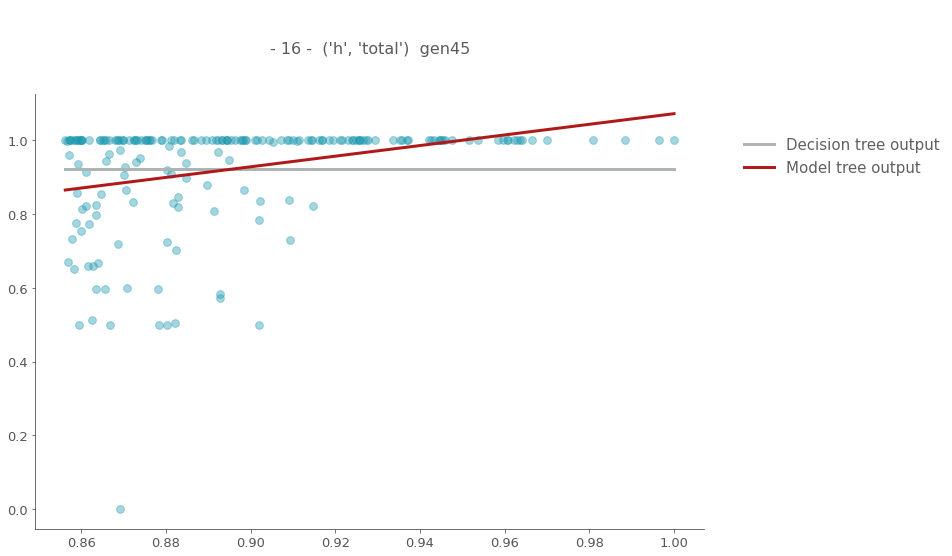

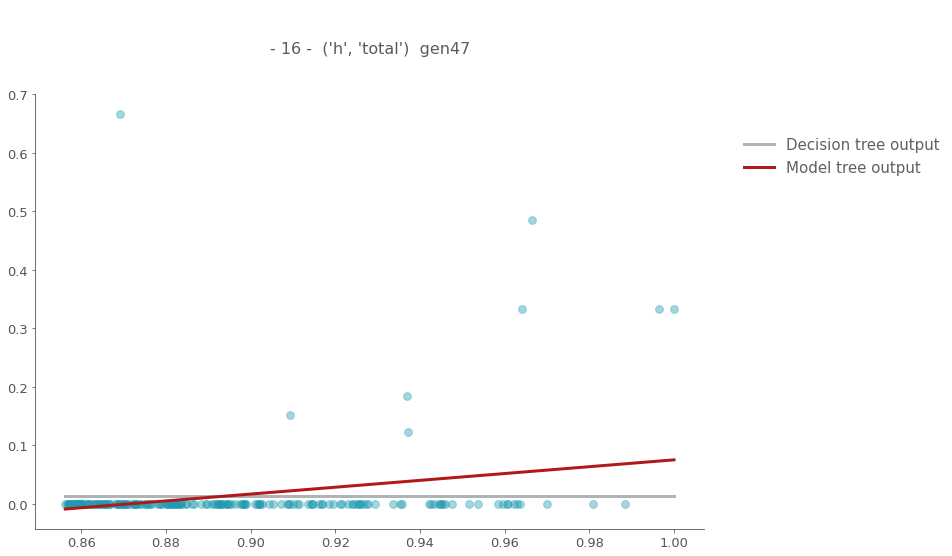

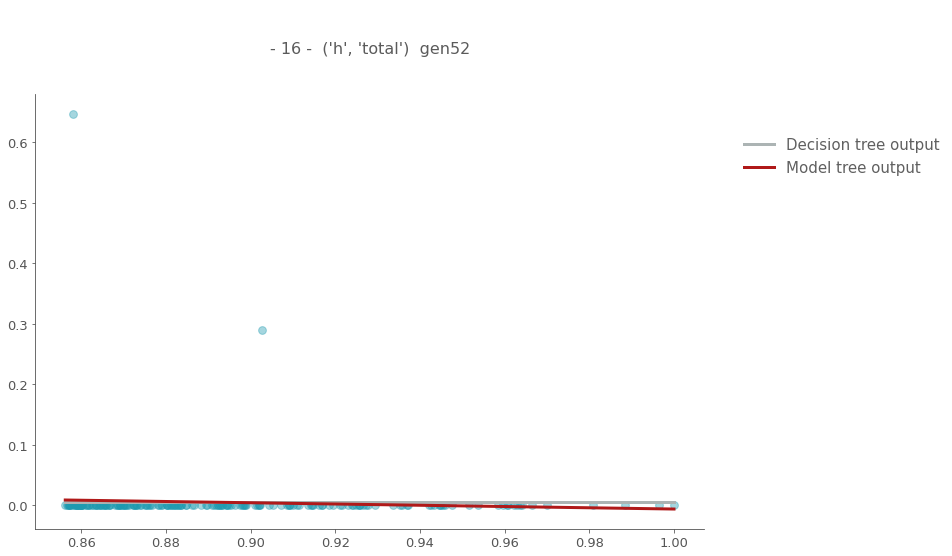

In [199]:
# plot nodes

mpl.rcParams['text.color'] = '#555555'

for leaf in range(1, len(lr_tnodes)+1):
    samples = ss[leaf-1]

    col = lr_tnodes[leaf-1]['var']
    s = list(pd.Series([len(x) for x in tree_nodes])[pd.Series([len(x) for x in tree_nodes]) == samples].index)

    if len(s) == 1:

        s = s[0]
        for g, m, n in zip(y_error.columns, [coef[0] for coef in lr_tnodes[leaf-1]['lr'].coef_], lr_tnodes[leaf-1]['lr'].intercept_):
            if abs(m) >= 0.01:

                fig, ax = plt.subplots(figsize = (12,8))
                plt.scatter(X[X<1000].fillna(0).loc[tree_nodes[s], col], y.unstack(2).loc[tree_nodes[s], g], alpha = 0.4, s = 60, color = '#1e9ab0')
                plt.plot([X[X<1000].fillna(0).loc[tree_nodes[s], col].min(), X[X<1000].fillna(0).loc[tree_nodes[s], col].max()], [y.unstack(2).loc[tree_nodes[s], g].mean(), y.unstack(2).loc[tree_nodes[s], g].mean()], color = '#acb4b4', lw = 3, label = 'Decision tree output')
                plt.plot([X[X<1000].fillna(0).loc[tree_nodes[s], col].min(), X[X<1000].fillna(0).loc[tree_nodes[s], col].max()], [X[X<1000].fillna(0).loc[tree_nodes[s], col].min() * m + n, X[X<1000].fillna(0).loc[tree_nodes[s], col].max() * m + n], color = '#b01919', lw = 3, label = 'Model tree output')                
                
                ax.legend(loc = (1.05, 0.8), frameon = False, fontsize = 15, labelcolor = '#606060')
                ax.spines["right"].set_visible(False)
                ax.spines["top"].set_visible(False)
                ax.spines["left"].set_color('#4a4a4a')
                ax.spines["bottom"].set_color('#4a4a4a')

                ax.tick_params(color = '#555555', labelcolor = '#555555')
                ax.set_title('\n\n- ' + str(leaf) + ' -  ' + str(col) + '  ' + g + '\n\n', fontsize = 16, color = '#333333', alpha = 0.8)
                plt.xticks(fontsize = 13, color = '#555555')
                plt.yticks(fontsize = 13, color = '#555555')

                #ax.set_ylabel('       RMSE', rotation=0, position = (0.3,1.02), fontsize = 15, color = '#555555')
                #ax.set_xlabel('\nMaximum tree depth', fontsize = 15, color = '#555555')
                plt.show()

                #y.unstack(2).loc[tree_nodes[11], 'gen03'].mean()
                #y.unstack(2).loc[tree_nodes[11], 'gen03'].value_counts()

    elif len(s) > 1:
        print('Hay más de un nodo con', samples, 'samples')

    else:
        print('No hay ningún nodo con', samples, 'samples')

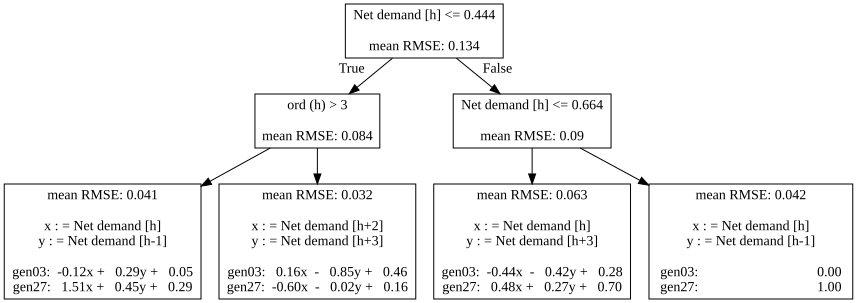

In [1470]:
# Process text + LR2  
remove_error   = False
remove_samples = True
include_values = True
include_names  = True
only_leafs     = True
all_errors     = True
replace_NaN    = True
fill_color     = False
include_lr     = True
add_line       = 2
lr_prec        = 2

X_error        = X.copy()
y_error        = y.unstack(2).copy()

#gen = y_error.columns
#gen = y_error.T.drop_duplicates().index
gen = ['gen' + str(g).zfill(2) for g in [3, 27]]

tree_graph = tree.export_graphviz(model, 
                                  filled = fill_color, 
                                  precision = 3,
                                  label = 'none',
                                  impurity = True,
                                  feature_names = [str(col[2]) +  ' [' + str(col[0]) + ']' for col in X_error.columns]
                                 ).split('\n')
if 1: 
    n, t = 0, 0
    tree_graph_error = tree.export_graphviz(model, 
                                            precision = 15,
                                            label = 'none',
                                            impurity = False,
                                            feature_names = [str(col[2]) +  ' [' + str(col[0]) + ']' for col in X_error.columns]
                                           ).split('\n')
    feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X_error.columns]
    decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                               max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
    tree_nodes = get_node_samples(decision_path, X_error)
    include_lr = add_lr and include_lr
    frmt = [''.join(['{:', str(4+lr_prec), '.', str(lr_prec),'f}']), ''.join(['{:', str(4+lr_prec), '.', str(lr_prec),'f}'])]
    var_names = ['x','y','z','u','v','w','t']
    
for i in range(2, len(tree_graph) - 1):
    
    string = tree_graph[i]
    try:
        
        if string.find('->') == -1:

            split0 = string.find('"')
            split1 = string.find('[[')
            split2 = string.find(']]')
            cond   = string.find('<=')

            values = pd.Series(eval(string[split1 + 1: split2 + 1].replace(']\\n[', ',')), index = y_error.columns).loc[gen]

            if cond == -1:
                node = pd.Series([string[:split0 + 1]] + string[split0 + 1: split1 - 2].split('\\n'), index = ['label', 'error', 'samples'])   
            else:
                node = pd.Series(string[: split1 - 2].split('\\n'), index = ['label', 'error', 'samples'])
                if replace_NaN and float(node['label'][cond + 2:]) > 1:
                    node['label'] = node['label'][:split0 + 1] + 'ord (h) > ' + node['label'][cond - 3]  + '\\n' #node['label'][:cond] + '!= NaN\\n'
                else:
                    node['label'] = node['label'] + '\\n'

            if remove_error:
                node['error'] = ''
            else:

                if len(tree_nodes[n]) > 0:

                    y_node = y_error.loc[tree_nodes[n]]

                    if cond != -1 or not include_lr:
                        string2 = tree_graph_error[i]
                        start = string2.find('[[')
                        end = string2.find(']]')
                        y_pred = pd.DataFrame([eval(string2[start + 1: end + 1].replace(']\\n[', ','))] * len(tree_nodes[n]), 
                                              index = tree_nodes[n], columns = y_error.columns)

                    else:
                        y_pred = pd.DataFrame(lr_tnodes[t]['lr'].predict(X[X<1000].fillna(0).loc[tree_nodes[n], [*lr_tnodes[t]['var']]]), 
                                              index = tree_nodes[n], columns = y_error.columns)


                    if all_errors:
                        node_error = [mean_squared_error(y_node[g], y_pred[g]) ** 0.5 for g in y_error.columns]
                    else:
                        node_error = [mean_squared_error(y_node[g], y_pred[g]) ** 0.5 for g in gen]

                    node_error = str(round(np.mean(node_error), 3))

                else:
                    node_error = '-'

                node['error'] = ''.join((('mean RMSE: ', 'RMSE: ')[int(len(gen) == 1)], node_error, '\\n'))          

            if remove_samples:
                node['samples'] = ''
            else:
                node['samples'] = ''.join(('samples: ', node['samples'], '\\n'))

            if include_lr and cond == -1:
                values = {var:coefs for var, coefs in zip(var_names, [lr_tnodes[t]['lr'].coef_[:,i] for i in range(lr_tnodes[t]['lr'].coef_.shape[1])])}
                values['intercept'] = lr_tnodes[t]['lr'].intercept_
                values = pd.DataFrame(values, index = y_error.columns).loc[gen].round(lr_prec)

                temp = values.iloc[:,[0,1]].apply(lambda x: frmt[0].format(x[0]) + x.index[0] + ('  - ','     ',' + ')[int(np.sign(x[1]) + 1)] 
                                                         if x[0] != 0  
                                                         else ' '*(8 + 2*lr_prec) + ('   ', ' - ')[int(x[1] < 0)], axis = 1)
                for v in range(1, values.shape[1] - 1):

                    temp = temp + values.iloc[:,[v,v+1]].apply(lambda x: frmt[0].format(np.abs(x[0])) + x.index[0] + ('  - ','     ',' + ')[int(np.sign(x[1]) + 1)] 
                                                                        if x[0] != 0  
                                                                        else ' '*(8 + 2*lr_prec) + ('   ', ' - ')[int(x[1] < 0)], axis = 1)

                values = temp + values.apply(lambda x: ' '*(x[:-1].abs().sum() == 0) + frmt[1].format(np.abs(x['intercept']))
                                                       if (x['intercept'] != 0 or x[:-1].abs().sum() == 0) 
                                                       else ' '*(5 + 2*lr_prec), axis = 1)#.str.replace('0.'+'0'*lr_prec, '0 '+' '*lr_prec)

                t = t + 1
            else:    
                values = values.astype(str)   

            if include_values and include_names and (not only_leafs or cond == -1):
                if include_lr and cond == -1:
                    values = '\\n'.join((''.join((gen, ': ', val)) for gen, val in values.iteritems()))
                    names = [name + ' : = ' 'Net demand [{:s}]'.format(var) for name, var in zip(var_names, [*lr_tnodes[t-1]['var']])]
                    max_len = np.max([len(name) for name in names])
                    names = [name + '  '*(max_len - len(name)) for name in names]
                    values = '\\n'.join(names) + '\\n\\n' + values
                else:
                    max_len = values.str.len().max() 
                    values = '\\n'.join((''.join((gen, ': ', val, '  '*(max_len - len(val)))) for gen, val in values.iteritems()))
            elif include_values and (not only_leafs or cond == -1):
                values = '\\n'.join(values)
            else:
                values = ''

            tree_graph[i] = ''.join((node['label'], 
                                     '\\n' * (add_line > 1 and cond >= 0), node['error'], node['samples'], 
                                     '\\n' * (add_line > 0 and include_values and (not only_leafs or cond == -1) and not (remove_error and remove_samples)), 
                                     values)) + string[split2 + 2:]

            n = n + 1  
    except:
        pass
        
tree_graph = '\n'.join(tree_graph)

with open("tree_vProduct1.dot", "w") as tree_file:
    tree_file.write(tree_graph)   
graph = graphviz.Source(tree_graph)
with open('tree_vProduct1.svg', 'w') as f:
    f.write(graph._repr_svg_())  
graph

#### Classification

In [393]:
var = 'vCommitt'
target = 'Value_bin'

X_sc_net_dem = (sc_net_demand/sc_net_demand.abs().max()).reset_index()
copy_X = X_sc_net_dem.set_index(['Sce','hour']).copy()

if var != 'vCirPF' and var != 'eCirPF':
    copy_y = data_bin[data_bin['Result'] == var].set_index(['Sce','hour','gen']).loc[:, target].unstack('gen').copy() # , 'su_type', 'node', 'start_node', 'end_node', 'circ'

else:
    copy_y = data_bin[data_bin['Result'] == var].copy()
    copy_y['line'] = copy_y['start_node']+copy_y['end_node']+copy_y['circ']
    copy_y = copy_y.set_index(['Sce','hour','line']).loc[:, target].unstack(['line']).copy() # , 'su_type', 'node', 'start_node', 'end_node', 'circ'

In [394]:
# Build X and y 

model = 'dt'
select_features = 15 #<1 para no filtrar columnas

X = pd.concat([copy_X.unstack(0).shift( 3).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift( 2).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift( 1).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X,
               copy_X.unstack(0).shift(-1).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift(-2).T.unstack(-1).T.swaplevel().sort_index() - copy_X,
               copy_X.unstack(0).shift(-3).T.unstack(-1).T.swaplevel().sort_index() - copy_X
              ], axis = 1, keys = ['h-3', 'h-2', 'h-1', 'h', 'h+1', 'h+2', 'h+3'])


y = copy_y.loc[X.index]
y.columns = y.columns.get_level_values(0)
y = y.stack(dropna = False).round(0).astype(int)

X_cols = X.columns


# Train and test
shuffle = y.index.get_level_values(0).unique().to_series().sample(frac = 1, random_state = 2)
sc_train = shuffle[:int(n_sc*0.8)]
sc_test  = shuffle[int(n_sc*0.8):]


if model == 'gbm':     
    X.columns = ['__'.join(str(level) for level in col) for col in X.columns.values]

else:
    X = X.fillna(9999999)
        
if select_features > 0:

    
    rf = RandomForestClassifier(n_estimators = 200, random_state=0)
    rf.fit(X.loc[sc_train], y.unstack().loc[sc_train])
    importances = pd.Series(rf.feature_importances_, index = X_cols)
    
    cols = [var for var, val in sorted(zip(X_cols, rf.feature_importances_), key= lambda x: x[1], reverse = True)][:select_features]
    X = X[cols]

##### Importances 

In [78]:
if select_features < 1:
    rf = RandomForestClassifier()
    rf.fit(X,y.unstack())
    importances = pd.Series(rf.feature_importances_, index = X_cols)

In [79]:
# Feature importances

feature_names = []

for f in X_cols:
    if f[0] == 'h':
        if f[1] == 'total':
            feature_names.append('            Total ND  [h]      ')
        else:
            feature_names.append('    ND ' + f[1] + '  [h]      ')
            
    else:
        if f[1] == 'total':
            feature_names.append('     Total ΔND  [' + f[0] + ']' + '  '*(f[0][1]=='-') + ' ')
        else:
            feature_names.append('ΔND ' + f[1] + '  [' + f[0] + ']' + '  '*(f[0][1]=='-') + ' ')

importances.index = feature_names

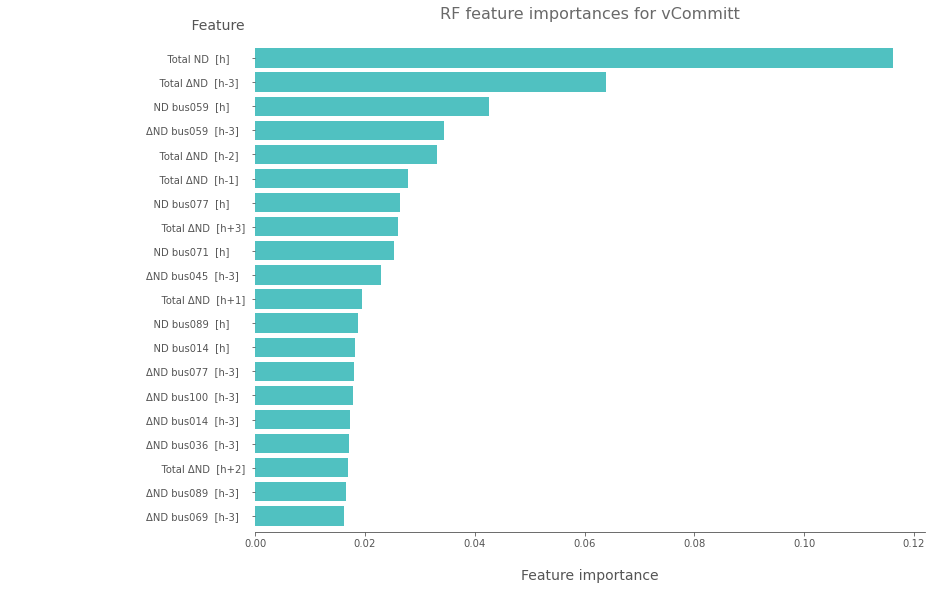

In [80]:
# Plot importances

fig, ax = plt.subplots(figsize = (12,9))
mpl.rcParams['text.color'] = '#555555'

importances.sort_values().iloc[-20:].plot(kind='barh', ax = ax, width = .8, color = '#16adad', alpha = 0.75)

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_color('#4a4a4a')

ax.tick_params(color = '#555555', labelcolor = '#555555')
ax.set_title('RF feature importances for ' + var + '\n', fontsize = 16, color = '#444444', alpha = 0.8)

ax.set_ylabel('                                         Feature', rotation=0, position = (0.3,1.02), fontsize = 14, color = '#555555')
ax.set_xlabel('\nFeature importance', fontsize = 14, color = '#555555')
plt.show()

##### Otros modelos

In [92]:
# Minimum accuracy

scores = []
for g in y.index.get_level_values(-1).unique():
    scores.append(accuracy_score(y.unstack(-1).loc[sc_test, g], pd.Series(y.unstack(-1).loc[sc_train, g].mode()[0], index = y.unstack(-1).loc[sc_test].index)))
    
print('Minimum accuracy:', round(np.mean(scores), 4))
print('std accuracy:', round(np.std(scores), 4))

Minimum accuracy: 0.9082
std accuracy: 0.1275


In [93]:
# LR 
model = LogisticRegression()

scores = []

for g in y.index.get_level_values(-1).unique():
    
    if y.unstack(2).loc[sc_train, g].astype(int).std() > 0:
        model.fit(X.loc[sc_train].fillna(0), y.unstack(2).loc[sc_train, g])
        y_pred = pd.Series(model.predict(X.loc[sc_test].fillna(0)), index = y.unstack(2).loc[sc_test].index)

    else:
        y_pred = pd.Series(y.unstack(2).loc[sc_train, g][0], index = y.unstack(2).loc[sc_test].index)
        
    scores.append(accuracy_score(y.unstack(-1).loc[sc_test, g], y_pred))


print('Accuracy LR:', round(np.mean(scores), 4))
print('std accuracy: LR', round(np.std(scores), 4))

Accuracy LR: 0.8209
std accuracy: LR 0.1948


In [94]:
# GBM 
warnings.filterwarnings("ignore")
model = xgb.XGBClassifier(eval_metric = 'error')

scores = []

for g in y.index.get_level_values(-1).unique():

    model.fit(X.loc[sc_train].fillna(9999), y.unstack(2).loc[sc_train, g].astype(int))
    y_pred = pd.Series(model.predict(X.loc[sc_test].fillna(9999)), index = y.unstack(2).loc[sc_test].index)
    
    scores.append(accuracy_score(y.unstack(-1).loc[sc_test, g], y_pred))


print('Accuracy GBM:', round(np.mean(scores), 4))
print('std accuracy: GBM', round(np.std(scores), 4))

Accuracy GBM: 0.9759
std accuracy: GBM 0.0339


##### Grid Search

In [257]:
# GRID SEARCH todos los generadores juntos mismo árbol  

print_loop = True

n_sc = int(len(X.loc[sc_train])/24)
n_h = 24
n_gen = 54
n_folds = 6

    
grid = {'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16],
        'min_samples_leaf': [2, 3, 4, 6, 8, 10, 12, 14, 16, 20, 24, 30, 36],
        'max_leaf_nodes': [16, 32, 64, 128, 256, 512, 1024],
        'ccp_alpha': [0]
       }
    
idx = y.index.get_level_values(2).unique()
cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
grid_scores = pd.Series(np.nan, index = pd.MultiIndex.from_product([grid[key] for key in grid.keys()], names = [key for key in grid.keys()]))

t = time.time()

for params in grid_scores.index:

    params_dict = dict(zip([key for key in grid.keys()], params))
    scores = []
    
    if params_dict['max_leaf_nodes'] > max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]):
        
        grid_scores.loc[params] = grid_scores.loc[(params_dict['max_depth'], 
                                                   params_dict['min_samples_leaf'],  
                                                   max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]))] 
        
    else:    
    
        for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):

            train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
            test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

            model = tree.DecisionTreeClassifier(**params_dict, random_state = 0)
            model.fit(X.loc[sc_train].iloc[train_h], y.loc[sc_train].unstack(2).iloc[train_h])

            y_pred = pd.DataFrame(model.predict(X.loc[sc_train].iloc[test_h]), index = y.loc[sc_train].unstack(2).iloc[test_h].index, columns = idx)

            for g in idx:

                scores.append(accuracy_score(y.unstack(2).loc[y_pred.index, g], y_pred[g]))

        grid_scores[params] = np.mean(scores)
    
    if print_loop:   
        clear_output(wait=True)
        print('Grid Search...', round(100 * print_loop/len(grid_scores), 2), '%')
        #print('Running time:', int(time.time() - t), ' s')
        print('Last:', round(grid_scores[params], 4), '\t\t', params)
        print('Best:', round(grid_scores.max(), 4), '\t\t', grid_scores.idxmax())
        print_loop = print_loop + 1 
        
grid_scores_unico = grid_scores.copy()

Grid Search... 100 %
Last: 0.9769
Best: 0.9797


In [258]:
# GRID SEARCH por separado

print_loop = True

n_sc = int(len(X.loc[sc_train])/24)
n_h = 24
n_gen = 54
n_folds = 6
    
grid = {'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 20],
        'min_samples_leaf': [1, 2, 3, 4, 5, 6, 8, 10, 12, 14, 16, 20, 24, 32, 40, 52, 64],
        'max_leaf_nodes': [16, 32, 64, 128, 256, 512, 1024],
        'ccp_alpha': [0]
       }
    

cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
grid_scores = pd.DataFrame(np.nan, 
                           columns = y.unstack(2).columns,
                           index = pd.MultiIndex.from_product([grid[key] for key in grid.keys()], names = [key for key in grid.keys()]))

t = time.time()

for params in grid_scores.index:

    params_dict = dict(zip([key for key in grid.keys()], params))
    
    if params_dict['max_leaf_nodes'] > max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]):
        
        grid_scores.loc[params] = grid_scores.loc[(params_dict['max_depth'], 
                                                   params_dict['min_samples_leaf'],  
                                                   max([2 ** params_dict['max_depth'], min(grid['max_leaf_nodes'])]))] 
        
    else:
        
        for g in grid_scores.columns:    

            scores = []

            for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):

                train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
                test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

                model = tree.DecisionTreeClassifier(**params_dict, random_state = 0)
                model.fit(X.loc[sc_train].iloc[train_h], y.loc[sc_train].loc[pd.IndexSlice[:,:,g]].iloc[train_h])

                y_pred = pd.Series(model.predict(X.loc[sc_train].iloc[test_h]), index = y.loc[sc_train].loc[pd.IndexSlice[:,:,[g]]].iloc[test_h].index)

                scores.append(accuracy_score(y.loc[y_pred.index], y_pred))

            grid_scores.loc[params, g] = np.mean(scores)

    if print_loop:   
        clear_output(wait=True)
        print('Grid Search...', round(100 * print_loop/len(grid_scores), 2), '%')
        #print('Running time:', int(time.time() - t), ' s')
        print('Last:', round(grid_scores.loc[params].mean(), 4))
        print('Best:', round(grid_scores.max().mean(), 4))
        print_loop = print_loop + 1 

grid_scores_sep = grid_scores.copy()

Grid Search... 100 %
Last: 0.9813
Best: 0.9818


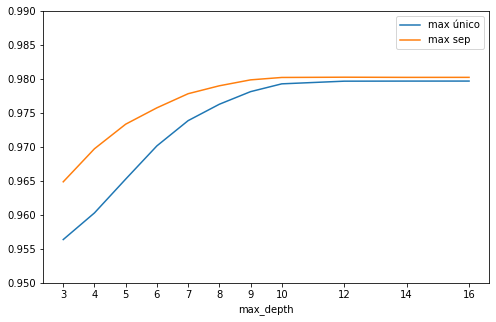

In [20]:
param = 'max_depth'

plt.figure(figsize = (8,5))
plt.ylim(0.95,0.99)
ticks = list(set(grid_scores_sep.index.to_frame()[param].unique()).intersection(set(grid_scores_unico.index.to_frame()[param].unique())))
plt.xticks(ticks)
grid_scores_unico.groupby(param).max().loc[ticks].plot(label = 'single DT')
grid_scores_sep.mean(axis = 1).groupby(param).max().loc[ticks].plot(label = 'multiples DTs')
plt.legend()
plt.show()

##### Bayesian Optimization 

In [374]:
# OPT BAYESIANA

max_evals = 70 #(per depth)

bayes_scores = pd.DataFrame(columns = ['max_depth', 'min_samples_leaf', 'max_leaf_nodes', 'ccp_alpha', 'accuracy'], index = np.arange(8))

for depth in range(3, 11):
    space = {'max_depth': hp.choice('max_depth', [depth]),
             'min_samples_leaf': hp.quniform('min_samples_leaf', 2, 200, 2),
             'max_leaf_nodes': hp.qloguniform('max_leaf_nodes', np.log(16), np.log(2**10), 2),
             'ccp_alpha': hp.loguniform('ccp_alpha', np.log(1e-8), np.log(1e-4))
            }


    def objective(params):
        
        n_sc = int(len(X.loc[sc_train])/24)
        n_h = 24
        n_gen = 54
        n_folds = 6

        try:
            idx = y.index.get_level_values(2).unique()
            params_dict = dict(zip([key for key in params.keys()], [int(params[key]) for key in params.keys()]))
            cv = KFold(n_splits = n_folds, shuffle = True, random_state = 0)
            scores = []

            for train, test in cv.split(np.arange(n_sc), np.arange(n_sc)):

                train_h = np.sort(np.concatenate([train*n_h + h for h in range(n_h)]))
                test_h = np.sort(np.concatenate([test*n_h + h for h in range(n_h)]))

                model = tree.DecisionTreeClassifier(**params_dict, random_state = 0)

                model.fit(X.loc[sc_train].iloc[train_h], y.loc[sc_train].unstack(2).iloc[train_h])

                y_pred = pd.DataFrame(model.predict(X.loc[sc_train].iloc[test_h]), index = y.loc[sc_train].unstack(2).iloc[test_h].index, columns = idx)

                for g in idx:
                    scores.append(accuracy_score(y.unstack(2).loc[y_pred.index, g], y_pred[g]))

            error = np.mean(scores)

        except:
            error = -1000000     
        return -error     #Minimize

    trials = Trials()
    best = fmin(fn = objective, space = space, max_evals = max_evals, algo = tpe.suggest, trials = trials)
    bayes_scores.loc[depth-3] = [depth, best['min_samples_leaf'], best['max_leaf_nodes'], best['ccp_alpha'], -min(trials.losses())] 
    print('\nDepth ' + str(depth) + ':', best, '\n\n')

In [375]:
bayes_scores

##### Train 

In [214]:
# TRAIN  

dict_params =  {'max_depth': 6,
                'min_samples_leaf': 6, 
                'max_leaf_nodes': 56,
                'ccp_alpha': 0
               }

n_h = 24
n_gen = 54
n_folds = 6

model = tree.DecisionTreeClassifier(**dict_params, random_state = 0)
model = model.fit(X, y.unstack(2))

###### Clustering - Leaves 

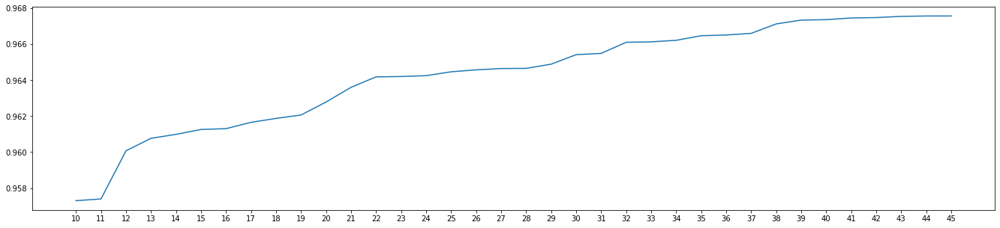

In [706]:
# Exploratory clustering - Leaves

feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X.columns]
decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                           max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
tree_leaves = get_terminal_node_samples(decision_path, X_error)
y_clust = pd.DataFrame(model.predict(X), index = y.unstack().index, columns = y.unstack().columns)
y_clust['node'] = pd.concat([pd.Series(leaf, index = tree_leaves[leaf]['samples']) for leaf in range(len(tree_leaves))]).sort_index()
y_clust = y_clust.reset_index().set_index(['Sce', 'hour', 'node'])


max_clusters = len(y_clust.drop_duplicates())

km_runs = []
km_costs = []
km_errors = []
plt.ion()

for n in range(1, max_clusters + 1):
    km = KModes(n_clusters=n, init='Cao', max_iter=30, verbose=1, n_jobs=2)
    km.fit(y_clust)
    y_pred = pd.concat([pd.Series(km.cluster_centroids_[c]) for c in km.predict(y_clust)], axis = 1).T
    y_pred.columns = y_clust.columns
    
    km_runs.append(km)
    km_costs.append(km.cost_)
    km_errors.append(round(np.mean([accuracy_score(y.unstack()[g], y_pred[g]) for g in y_pred.columns]),4))
    
    clear_output(wait=True)
    
#    for i in range(n):
#        print(i+1, 'clusters:', np.round(km_errors[i],1))

    if len(km_errors) > 1:
        plt.figure(figsize = (23,5))
        plt.plot(np.arange(1, n+1), km_errors)
        plt.xticks(np.arange(1, n+1))
        plt.show()


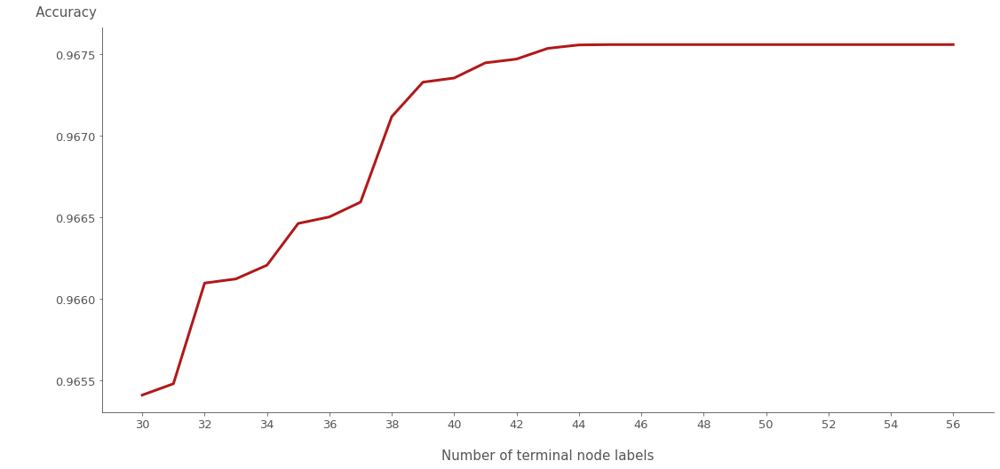

In [731]:
# Plot results 
ini = 10
ini2 = 30
out = pd.Series(km_errors + [km_errors[-1]] * (len(tree_leaves) - len(y_clust.drop_duplicates() - ini)), index = np.arange(ini, len(tree_leaves) + 1))


mpl.rcParams['text.color'] = '#555555'

fig, ax = plt.subplots(figsize = (18,8))
out.iloc[ini2-ini:].plot(color = '#b01919', lw = 3, label = 'Model tree output', ax = ax)            

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_color('#4a4a4a')
ax.spines["bottom"].set_color('#4a4a4a')

ax.tick_params(color = '#555555', labelcolor = '#555555')
plt.xticks(np.arange(15,29) * 2, fontsize = 13, color = '#555555')
plt.yticks(fontsize = 13, color = '#555555')

ax.set_ylabel('       Accuracy', rotation=0, position = (0.3,1.02), fontsize = 15, color = '#555555')
ax.set_xlabel('\nNumber of terminal node labels', fontsize = 15, color = '#555555')
plt.show()


In [227]:
# Final clustering - Leaves

n = 39

decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                           max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
tree_leaves = get_terminal_node_samples(decision_path, X_error)
y_clust = pd.DataFrame(model.predict(X), index = y.unstack().index, columns = y.unstack().columns)
y_clust['node'] = pd.concat([pd.Series(leaf, index = tree_leaves[leaf]['samples']) for leaf in range(len(tree_leaves))]).sort_index()
y_clust = y_clust.reset_index().set_index(['Sce', 'hour']).drop('node', axis = 1)


max_clusters = len(y_clust.drop_duplicates())

km = KModes(n_clusters=n, init='Cao', max_iter=30, verbose=1, n_jobs=2)
km.fit(y_clust)
y_pred = pd.concat([pd.Series(km.cluster_centroids_[c]) for c in km.predict(y_clust)], axis = 1).T
y_pred.columns = y_clust.columns


In [235]:
# Process labels
clustered_leaves = []
for leaf in tree_leaves:
    clustered_leaves.append(km.predict(y_clust.loc[leaf['samples']].iloc[[0]])[0])
    
clust_labels = pd.Series(clustered_leaves)
clust_labels = clust_labels.map(clust_labels.drop_duplicates().reset_index(drop = True).reset_index().set_index(0).reset_index().set_index(0).iloc[:,0].to_dict())
clust_dic = clust_labels.drop_duplicates().to_dict()


###### Clustering - target variables 

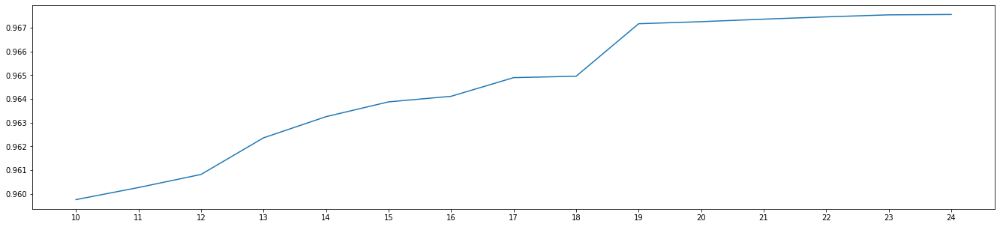

In [738]:
# Exploratory clustering - target variables

decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                           max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
tree_leaves = get_terminal_node_samples(decision_path, X_error)
y_clust = pd.DataFrame(model.predict(X), index = y.unstack().index, columns = y.unstack().columns)
y_clust['node'] = pd.concat([pd.Series(leaf, index = tree_leaves[leaf]['samples']) for leaf in range(len(tree_leaves))]).sort_index()
y_clust = y_clust.reset_index().set_index(['Sce', 'hour']).drop('node', axis = 1)

y_clust = y_clust.T


max_clusters = len(y_clust.drop_duplicates())

km_runs = []
km_costs = []
km_errors = []
plt.ion()

for n in range(10, max_clusters + 1):
    km = KModes(n_clusters=n, init='Cao', max_iter=30, verbose=1, n_jobs=2)
    km.fit(y_clust)
    y_pred = pd.concat([pd.Series(km.cluster_centroids_[c]) for c in km.predict(y_clust)], axis = 1).T
    y_pred.index = y_clust.index
    
    km_runs.append(km)
    km_costs.append(km.cost_)
    km_errors.append(np.mean([accuracy_score(y.unstack()[g], y_pred.T[g]) for g in y_pred.T.columns]))
    
    clear_output(wait=True)
    
#    for i in range(n):
#        print(i+1, 'clusters:', np.round(km_errors[i],1))

    if len(km_errors) > 1:
        plt.figure(figsize = (23,5))
        plt.plot(np.arange(10,n+1), km_errors)
        plt.xticks(np.arange(10,n+1))
        plt.show()


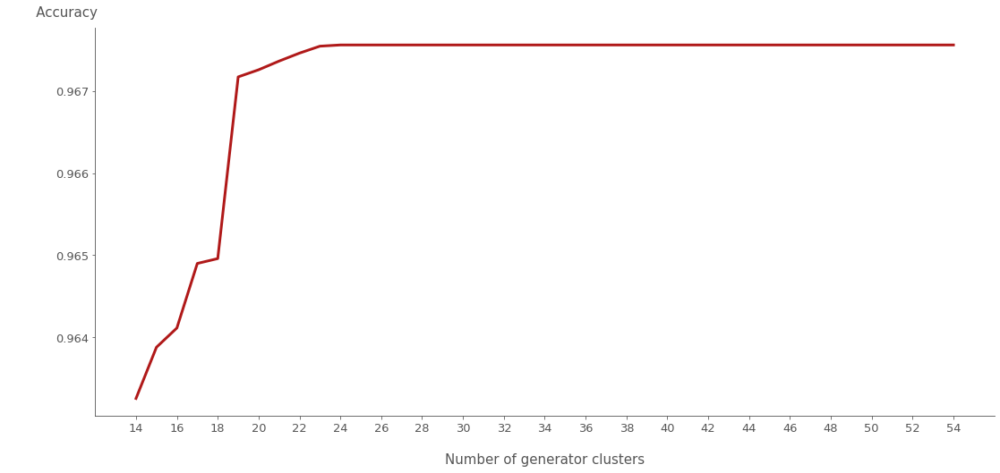

In [745]:
# Plot results
ini = 10
ini2 = 14
out = pd.Series(km_errors + [km_errors[-1]] * (54 - len(y_clust.drop_duplicates() - ini)), index = np.arange(ini, 54 + 1))


mpl.rcParams['text.color'] = '#555555'

fig, ax = plt.subplots(figsize = (18,8))
out.iloc[ini2-ini:].plot(color = '#b01919', lw = 3, label = 'Model tree output', ax = ax)            

#ax.legend(loc = (1.05, 0.8), frameon = False, fontsize = 15, labelcolor = '#606060')
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_color('#4a4a4a')
ax.spines["bottom"].set_color('#4a4a4a')

ax.tick_params(color = '#555555', labelcolor = '#555555')
#ax.set_title('\n\n- ' + str(leaf) + ' -  ' + str(col) + '  ' + g + '\n\n', fontsize = 16, color = '#333333', alpha = 0.8)
plt.xticks(np.arange(7,28) * 2, fontsize = 13, color = '#555555')
plt.yticks(fontsize = 13, color = '#555555')

ax.set_ylabel('       Accuracy', rotation=0, position = (0.3,1.02), fontsize = 15, color = '#555555')
ax.set_xlabel('\nNumber of generator clusters', fontsize = 15, color = '#555555')
plt.show()


In [254]:
# Final clustering - target variables

feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X.columns]
decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                           max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
tree_leaves = get_terminal_node_samples(decision_path, X_error)
y_clust = pd.DataFrame(model.predict(X), index = y.unstack().index, columns = y.unstack().columns)
y_clust['node'] = pd.concat([pd.Series(leaf, index = tree_leaves[leaf]['samples']) for leaf in range(len(tree_leaves))]).sort_index()
y_clust = y_clust.reset_index().set_index(['Sce', 'hour']).drop('node', axis = 1)

y_clust = y_clust.T


max_clusters = len(y_clust.drop_duplicates())

km_runs = []
km_costs = []
km_errors = []
plt.ion()

for n in [19]:
    km = KModes(n_clusters=n, init='Cao', max_iter=30, verbose=1, n_jobs=2)
    km.fit(y_clust)
    y_pred = pd.concat([pd.Series(km.cluster_centroids_[c]) for c in km.predict(y_clust)], axis = 1).T
    y_pred.index = y_clust.index



##### Plot Tree 

In [203]:
def get_node_samples(decision_path, X_split, level = 0):
    
    start = level * '|   ' + '|--- '
    n_rows = len(decision_path)
    
    if n_rows == 1:
        
        return [X_split.index]

    else:
        
        leaf_nodes = [X_split.index]
        split = np.arange(n_rows)[decision_path.str.startswith(start)][1]
        
        X_left = X_split[eval(decision_path.iloc[0][len(start):])]
        X_right = X_split[eval(decision_path.iloc[split][len(start):])]
        
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[1:split], X_left, level = level + 1)
        leaf_nodes = leaf_nodes + get_node_samples(decision_path.iloc[split + 1:], X_right, level = level + 1)
        
        return leaf_nodes

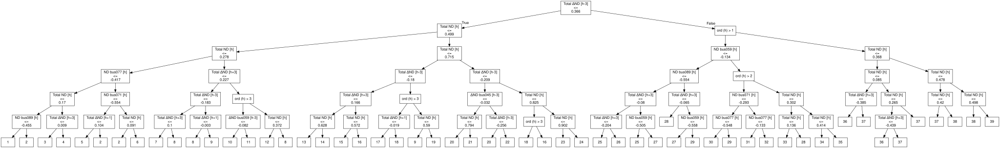

In [251]:
# Process text
remove_error   = True
remove_samples = True
include_values = False
include_names  = False
only_leaves    = True
leaf_label     = True
cluster_leaves = True
all_errors     = True
replace_NaN    = True
fill_color     = False
add_line       = 1

X_error        = X.copy()
y_error        = y.unstack(2).copy()

gen = y_error.columns[:10]
#gen = ['gen' + str(g).zfill(2) for g in [3,21]]
ss = []

feature_names = ['Total '*(col[1] == 'total') + 'Δ'*(col[0] != 'h') + 'ND ' +  (col[1] + ' ')*(col[1] != 'total') + '[' + str(col[0]) + ']' for col in X_error.columns]
tree_graph = tree.export_graphviz(model, 
                                  filled = fill_color, 
                                  precision = 3,
                                  label = 'none',
                                  impurity = True,
                                  #feature_names = [str(col[1]) +  ' [' + str(col[0]) + ']' for col in X_error.columns]
                                  #feature_names = [str(col[1]).replace('total','Total') + ' Net Demand [' + str(col[0]) + ']' for col in X_error.columns]
                                  feature_names = ['Total '*(col[1] == 'total') + 'Δ'*(col[0] != 'h') + 'ND ' +  (col[1] + ' ')*(col[1] != 'total') + '[' + str(col[0]) + ']' for col in X_error.columns]
                                 ).split('\n')



if not remove_error:
    
    n = 0
    tree_graph_error = tree.export_graphviz(model, 
                                            precision = 15,
                                            label = 'none',
                                            impurity = False,
                                            feature_names = [str(col[1]) +  ' [' + str(col[0]) + ']' for col in X_error.columns]
                                           ).split('\n')

    #feature_names = ['X_split[' + str(col).replace('nan', 'np.nan') + ']' for col in X_error.columns]
    feature_names = ['Total '*(col[1] == 'total') + 'Δ'*(col[0] != 'h') + 'ND ' +  (col[1] + ' ')*(col[1] != 'total') + '[' + str(col[0]) + ']' for col in X_error.columns]
    decision_path = pd.Series(tree.export_text(model, feature_names = feature_names, decimals = 15,
                                               max_depth = dict_params['max_depth'] + 1).split('\n')[:-1])
    tree_nodes = get_node_samples(decision_path, X_error)

t = 1
for i in range(2, len(tree_graph) - 1):
    
    string = tree_graph[i]
    
    if string.find('->') == -1:
        try:

            split0 = string.find('"')
            split1 = string.find('[[')
            split2 = string.find(']]')
            cond   = string.find('<=')

            values = pd.Series(eval(string[split1 + 1: split2 + 1].replace('\\n', ',')), index = y_error.columns).loc[gen]

            if cond == -1:
                node = pd.Series([string[:split0 + 1]] + string[split0 + 1: split1 - 2].split('\\n'), index = ['label', 'error', 'samples'])   
            else:
                node = pd.Series(string[: split1 - 2].split('\\n'), index = ['label', 'error', 'samples'])

                if replace_NaN and float(node['label'][cond + 2:]) > 1:
                    node['label'] = node['label'][:split0 + 1] + 'ord (h) > ' + node['label'][cond - 3]  + '\\n' #node['label'][:cond] + '!= NaN\\n'
                else:
                    node['label'] = node['label'] + '\\n'

            if remove_error:
                node['error'] = ''
            else:

                if len(tree_nodes[n]) > 0:

                    y_node = y_error.loc[tree_nodes[n]]

                    start = string.find('[[')
                    end = string.find(']]')
                    y_pred = eval(string[start + 1: end + 1].replace('\\n', ','))
                    y_pred = [(0, 1)[int(v[1] > v[0])] if max(v[1], v[0]) != len(tree_nodes[n]) else y_error.loc[tree_nodes[n]].iloc[0, g] for g, v in enumerate(y_pred)]
                    y_pred = pd.DataFrame([y_pred] * len(tree_nodes[n]), index = tree_nodes[n], columns = y_error.columns)

                    if all_errors:
                        node_error = [accuracy_score(y_node[g], y_pred[g]) for g in y_error.columns]
                    else:
                        node_error = [accuracy_score(y_node[g], y_pred[g]) for g in gen]

                    node_error = str(round(np.mean(node_error), 3))

                else:
                    node_error = '-'

                node['error'] = ''.join((('mean accuracy: ', 'accuracy: ')[int(len(gen) == 1)], node_error, '\\n'))
                n = n + 1        

            if leaf_label and cond == -1:
                if cluster_leaves:
                    node['leaf'] = ''.join(('', str(1 + clust_labels[t-1]), '', '\\n')) 
                else:
                    node['leaf'] = ''.join(('', str(t), '', '\\n')) 
                ss.append(int(node['samples']))
                t = t + 1
            else:      
                node['leaf'] = ''  

            if remove_samples:
                node['samples'] = ''
            else:
                node['samples'] = ''.join(('samples: ', node['samples'], '\\n'))  


            if include_values and include_names and (not only_leafs or cond == -1):
                values = '\\n'.join((gen + (': OFF', ': ON  ')[int(val[1] >= val[0])] for gen, val in values.iteritems()))
            elif include_values and (not only_leafs or cond == -1):
                values = '\\n'.join((['OFF', 'ON'][int(val[1] >= val[0])] for val in values))
            else:
                values = ''           

            tree_graph[i] = ''.join((node['label'], '\\n' * (add_line > 1 and cond >= 0), node['error'], node['samples'], node['leaf'], 
                                                    '\\n' * (add_line > 0 and include_values and (not only_leafs or cond == -1) and not (remove_error and remove_samples)),
                                     values)) + string[split2 + 2:]
        except: 
            pass
        
tree_graph = '\n'.join(tree_graph).replace('<=', '\n<=\n')

with open("tree_vCommit.dot", "w", encoding="utf-8") as tree_file:
    tree_file.write(tree_graph)   
graph = graphviz.Source(tree_graph)
with open('tree_vCommit_cl.svg', 'w', encoding="utf-8") as f:
    f.write(graph._repr_svg_())  
graph